### **INFO 2950 Final Project**

# Understanding relationships between county demographics and coronavirus outbreaks

The coronavirus pandemic has drastically changed American life as we know it for the time being. The disease has touched every corner of the US, from coast to coast, from the largest urban cities to the smallest rural towns. The disease spread has been rapid and alarming, especially considering how dangerous the virus is. As a result, states have enacted stay-at-home and social distancing policies to try and curb the spread of the disease. 

This has impacted nearly all facets of life. Over 30 million Americans have lost their jobs. Many who are still employed are working remotely, while still more essential workers are feeling the pressure of working on the front lines during this crisis.

How this may have long term effects on communities and vulnerable populations remains to be seen. Additionally, understanding regions and demographics that are particularly at risk for the spread of the disease could help inform social distancing policies, and allow us the allocate resources and react to new outbreaks more quickly.

The data description section will give a better understanding of the data we will be looking at to search for these trends.

## Data description

What are the observations (rows) and the attributes (columns)?
* The main dataset I've imported for this project is called finaldataset.csv, which is represented by the variable fulldata
* Each row of data represents information about a US county on a specific date.
* The columns keep track of information about each county's status related to coronavirus, such as total number of cases, as well as demographic information about the county.
* The demographic county information is static from day to day, so there is a lot of repeated information in the columns, but this still seemed like the easiest way to keep all the information together.
* Here is a list of all the attributes from the dataset, as well as a definition for categories that are not self-explantory:
    
    * FIPS :
    * State :
    * Area_name :
    * Rural_urban_continuum_code :
    * Urban_influence_code :
    * Metro_2013 : 
    * **TODO**


Why was this dataset created?
* This dataset was created to explore how economic and demographic factors may relate to areas that are particularly hard-hit by the virus. It combines three datasets from different sources.
* The coronavirus case data was created by the New York Times for use in their own reporting and data visualizations. 
* The Social Vulnerability Index (SVI) was created to identify and classify vulnerable populations, so that governing agencies could develop emergency-preparedness analysis and plans. It provides county data about population vulnerability based on demographic measurements of a variety of factors. These factors are categorized by "socioeconomic status", "household composition & disability", "minority status & languge", and "housing type and transportation."
* The county economic data was created by the Local Area Unemployment Statistics to measure economic growth and progress. It includes measures such as the rurality of the county, employment rates, median income, and median income relative to the rest of the state.

Who funded the creation of the dataset?
* Coronavirus data is created and funded by the New York Times.
* SVI data is created and funded by the government, specifically the Center for Disease Control (CDC) and Agency for Toxic Substances and Disease Registry (ATSDR)
* Unemployment data is created and funded by the US Economic Research Service

What processes might have influenced what data was observed and recorded and what was not?
* The main issue with the coronavirus data is just massive lack of and inconsistencies with testing.
* This has multiple effects: first, it is likely that deaths caused by coronavirus are being undercounted
* Also, it likely is drastically undercounting the number of cases of the disease. I suspect this is even more true in lower income and more rural communities, where testing is lagging the most.
* One metric I also track is the first day of the reported case in the county, which I also use to calculate spread speed. I think lack of testing may heavily influence the accuracy of this value.
* Additionally, sometimes SVI data uses a dummy value of zero if the calculation to estimate it caused a divide by zero error. I believe this mostly occurs when there is incomplete census data for an area, which is probably most frequently in more rural towns with lower incomes and/or less internet access.

What preprocessing was done, and how did the data come to be in the form that you are using?
* I did almost all my preprocessing in a seperate notebook called preproc.ipynb.
* I imported my three datasets (covid, svi, and unemployment) into the notebook. In doing this, I made sure my FIPS codes were imported as strings (to allow for leading zeros to be preserved).
* I merged the three datasets on the FIPS attribute.
* I also filtered out quite a few columns from the SVI and unemployment data, because these were very large datasets.
* I also added several columns of my own by calculating information from other parts of the set.
* After I finished, I saved the information into a CSV file called 'finaldataset.csv'
* I found the processing of the data to be one of the most time consuming aspects of the project. Because the dataset was so large, it was unwieldy to manage at first. Additionally, having to upload/save/modify these large files could be time consuming, especially when I made a mistake. For instance, at one point, I accidentally wrote a 1.5 gigabyte dataframe to a csv file, which took a long time with my not-super-powerful laptop. 
* At right around 35 megabytes, my final dataset is large but manageable. I'm hoping to filter out some columns I don't end up using at the end of the project to make it smaller still.

If people are involved, were they aware of the data collection and if so, what purpose did they expect the data to be used for?
* The SVI and economic data is government data compiled from census information.
* The coronavirus data is also sourced from local/state level press releases. 
* All the information is very depersonalized and shows county-level demographics, so I don't think that it poses any substantial privacy concerns.
* I think people generally expect for the government to collect depersonalized data like the ones shown. People would expect that this type of information might be used in a very broad sense to shape policies or at least inform legislators in their decision-making.
* The New York Times has generously made their collected coronavirus data open-source. I believed they hope that sharing this aggregated data could help other people understand and study the virus outbreak.


Where can your raw source data be found, if applicable? Provide a link to the raw data (hosted in a Cornell Google Drive or Cornell Box).
* Here is the link to my final, curated dataset: https://cornell.box.com/v/akl65-info2950
* Here is a link to the New York Times covid data : https://github.com/nytimes/covid-19-data/blob/master/us-counties.csv
* Here is a link to the download for the Social Vulnerability Index : https://svi.cdc.gov/data-and-tools-download.html
* Here is a link to the download for the county level employment data : https://www.ers.usda.gov/data-products/county-level-data-sets/download-data/ 
* My entire project, including all these datasets is also available at : https://github.com/Annika18/covid-final-project

## Importing libraries and data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, LogisticRegression
import plotly

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
import plotly.express as px

In [2]:
fulldata = pd.read_csv('finaldataset.csv', dtype={'FIPS': str})
fulldata.head()

,FIPS,State,Area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,cases_per_capita,cases_per_100k,density,first_day,days_since_first,spread_speed
0,01001,AL,"Autauga County, AL",2.0,2.0,1.0,25957,25015,942,3.6,...,0.581,0.5947,0.3741,0.4354,0.000018,1.811594,92.859967,63.0,0.0,1.000000
1,01001,AL,"Autauga County, AL",2.0,2.0,1.0,25957,25015,942,3.6,...,0.581,0.5947,0.3741,0.4354,0.000072,7.246377,92.859967,63.0,1.0,7.246377
2,01001,AL,"Autauga County, AL",2.0,2.0,1.0,25957,25015,942,3.6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,2.0,5.434783
3,01001,AL,"Autauga County, AL",2.0,2.0,1.0,25957,25015,942,3.6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,3.0,3.623188
4,01001,AL,"Autauga County, AL",2.0,2.0,1.0,25957,25015,942,3.6,...,0.581,0.5947,0.3741,0.4354,0.000109,10.869565,92.859967,63.0,4.0,2.717391


A quirk worth noting about this data: unfortunately, the New York Times data combines the five boroughs (counties) that make up New York City into row to represent the whole city. For this reason, there was no valid way to merge it with the county level data -- it didn't have a FIPs code and it would be too time-consuming for the scope of this project to try to combine the borough data from the other data sets using some sort of weighted average system. 

Instead, I created an extra dataset called nyc of just the covid cases in New York City, to be used for comparisons.

In [3]:
covid = pd.read_csv('covid2.csv')
covid.rename(columns={'fips':'FIPS'}, inplace=True)

covid['date'] = pd.to_datetime(covid["date"])
start_date = pd.Timestamp("2020-01-21")
covid["daysafter"] = (covid["date"] - start_date).dt.days

nyc = covid[covid['county']=='New York City']
nyc = nyc.assign(cases_per_capita = nyc['cases']/8398748)
nyc.head()

,date,county,state,FIPS,cases,deaths,daysafter,cases_per_capita
416,2020-03-01,New York City,New York,NaN,1,0,40,1.190654e-07
448,2020-03-02,New York City,New York,NaN,1,0,41,1.190654e-07
482,2020-03-03,New York City,New York,NaN,2,0,42,2.381307e-07
518,2020-03-04,New York City,New York,NaN,2,0,43,2.381307e-07
565,2020-03-05,New York City,New York,NaN,4,0,44,4.762615e-07


If we are not mapping the change in COVID over time, it will be easiest to look at the data just using the most recent day. I create the latest_date data subset for this.

In [4]:
latest_date = fulldata[fulldata['date']=='2020-05-05']

## Predicting death rate

One statistic about the coronavirus that seems simple but is deceptively tricky to measure is its death rate. For instance, in Italy, the death rate appeared to be around 13% in April. However, calculating a crude death rate (simply dividing total deaths by total cases) may not be a sufficient measurement. Here we'll plot the cases vs deaths by county, and come up with a regression line to estimate a death rate.

In [13]:
#Takes a data frame df and 2 string column names x and y, calculates and plots a linear regression of the data 
def lin_regress(df, x, y):
    model = LinearRegression(fit_intercept=True)
    model.fit(df[[x]], df[y])
    
    xfit = np.linspace(0, df[x].max(),1000)
    yfit = model.predict(xfit[:,np.newaxis])
    
    plt.figure(figsize=(5,5))
    plt.scatter(xfit,yfit,s=.5)
    plt.scatter(df[x], df[y], alpha=.1, color='red')

    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()
    
    print("Model slope:     ", model.coef_[0])
    print("Model intercept: ", model.intercept_)
    print("Model r-squared: ", model.score(df[[x]], df[y]))
    print("Correlation (r): ", np.corrcoef(df[x], df[y])[0][1])

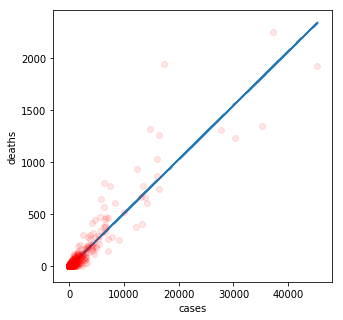

Model slope:      0.05177519870086469
Model intercept:  -0.29075646266553434
Model r-squared:  0.8825351438693539
Correlation (r):  0.9394334164108455


In [14]:
lin_regress(latest_date, 'cases', 'deaths')

This model shows that, as we would expect, there is a strong correlation of .93 between the number of coronavirus cases in a county, and the number of deaths in that county. As the r-squared value tells us, about 88% of the variance in number of deaths can be explained by the number of cases.

The slope of the model is .05. This means for every 1 new case in a county, there will be a .05 increase in deaths in the county. Put in a more intuitive way, for every 20 cases in a county there will be 1 death.

## What types of counties have the most cases?

In this next section, we will examine

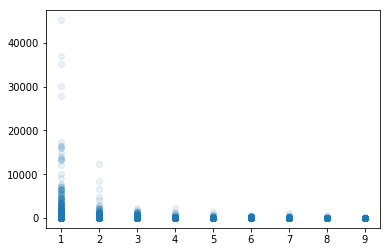

In [36]:
plt.scatter(latest_date['Rural_urban_continuum_code_2013'], latest_date['cases'], alpha=.1)
plt.show()

In [37]:
latest_date.sort_values(by='cases', ascending=False).head()

,FIPS,State,Area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,cases_per_capita,cases_per_100k,density,first_day,days_since_first,spread_speed
25361,17031,IL,"Cook County, IL",1.0,1.0,1.0,2611512,2506103,105409,4.0,...,0.0946,0.9618,0.8758,0.6755,0.008657,865.724209,5528.126575,3.0,102.0,8.487492
69532,36059,NY,"Nassau County, NY",1.0,1.0,1.0,707875,682848,25027,3.5,...,0.0392,0.9105,0.5546,0.2430,0.027387,2738.683910,4766.729993,44.0,61.0,44.896458
70464,36103,NY,"Suffolk County, NY",1.0,1.0,1.0,777784,747832,29952,3.9,...,0.0369,0.8545,0.4288,0.2146,0.023708,2370.789454,1631.869696,47.0,58.0,40.875680
70888,36119,NY,"Westchester County, NY",1.0,1.0,1.0,484256,465428,18828,3.9,...,0.0853,0.9392,0.9386,0.5516,0.031212,3121.235736,2250.086937,43.0,62.0,50.342512
8005,06037,CA,"Los Angeles County, CA",1.0,1.0,1.0,5136341,4896512,239829,4.7,...,0.1047,0.9933,0.9045,0.7682,0.002754,275.449166,2488.313394,5.0,100.0,2.754492


It looks like areas that are 1 on the rural urban continuum seem to have the most cases. These are larger cities, so this makes sense. But then this isn't a very useful measurement. Of course cities with more people tend to have more cases! We need to look at the infections per capita to get any sort of meaningful county information.

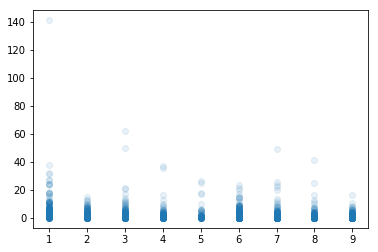

In [38]:
plt.scatter(latest_date['Rural_urban_continuum_code_2013'], latest_date['cases_per_100k']/100, alpha=.1)
plt.show()

In [39]:
model1 = LinearRegression(fit_intercept=True)

model1.fit(latest_date[['Rural_urban_continuum_code_2013', 'Urban_influence_code_2013']], latest_date['cases_per_capita'])

# print('rur-urb-cont  urban-influence')
# print(model1.coef_)

print('r^2 of rural urban continuum and case per capita at most recent date: ', np.corrcoef(latest_date['Rural_urban_continuum_code_2013'], latest_date['cases_per_capita'])[0,1])
print('r^2 of urban influence and case per capita at most recent date:       ', np.corrcoef(latest_date['Urban_influence_code_2013'], latest_date['cases_per_capita'])[0,1])


r^2 of rural urban continuum and case per capita at most recent date:  -0.11683351163137934
r^2 of urban influence and case per capita at most recent date:        -0.11112144070580203


It seems like at this point, because the virus is widespread, the rural urban contiuum and the urban influence don't have any significant correlation with the extent of the outbreak in each county. But there are a few huge outliers in terms of the cases per capita. In fact, if anything, more rural areas may have higher infection rates per capita, even though metro areas are more densely populated. 

But let's take a look at a few of the cities with the highest per capita infection rates.

In [40]:
latest_date.sort_values(by='cases_per_capita', ascending=False).head()

,FIPS,State,Area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,cases_per_capita,cases_per_100k,density,first_day,days_since_first,spread_speed
94585,47169,TN,"Trousdale County, TN",1.0,1.0,1.0,4888,4729,159,3.3,...,0.2200,0.4177,0.2862,0.5220,0.141231,14123.054424,83.722788,67.0,38.0,371.659327
5763,05079,AR,"Lincoln County, AR",3.0,2.0,1.0,4041,3867,174,4.3,...,0.2146,0.6390,0.9873,0.8134,0.062286,6228.550566,24.387353,55.0,50.0,124.571011
63476,31043,NE,"Dakota County, NE",3.0,2.0,1.0,10777,10404,373,3.5,...,0.5419,0.9599,0.8055,0.8615,0.049909,4990.894325,76.883504,82.0,23.0,216.995405
53275,27105,MN,"Nobles County, MN",7.0,8.0,0.0,11284,10988,296,2.6,...,0.6657,0.9325,0.7533,0.8150,0.048949,4894.912771,30.540053,80.0,25.0,195.796511
91251,47007,TN,"Bledsoe County, TN",8.0,7.0,0.0,4303,4053,250,5.8,...,0.2735,0.5769,0.8233,0.8159,0.041159,4115.874538,35.927927,67.0,38.0,108.312488


Let's look at how New York City's growth in coronavirus cases compares to some of the most affected counties.

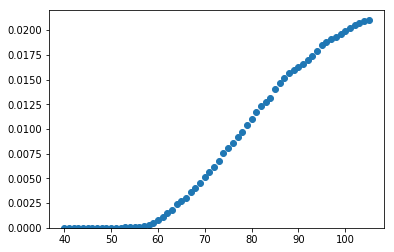

In [68]:
plt.scatter(nyc['daysafter'], nyc['cases_per_capita'])
plt.ylim(0,.022)
plt.show()

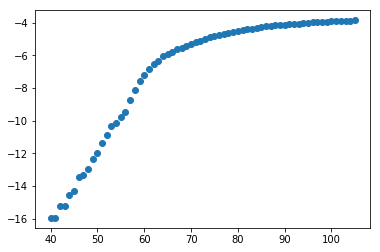

In [69]:
plt.scatter(nyc['daysafter'], np.log(nyc['cases_per_capita']))
plt.show()

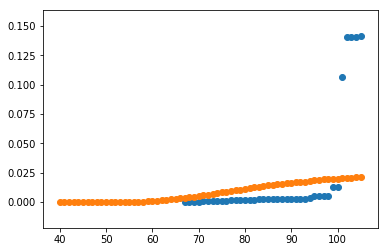

In [70]:
trousdale_county = fulldata[ fulldata['FIPS'] == '47169']

plt.scatter(trousdale_county['daysafter'], trousdale_county['cases_per_capita'])
plt.scatter(nyc['daysafter'], nyc['cases_per_capita'])
plt.show()


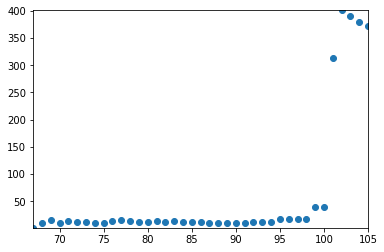

array([  1.        ,  10.44604617,  15.66906926,  10.44604617,
        13.05755771,  12.53525541,  12.18705387,  12.76738977,
        14.62446464,  13.29496785,  11.24958818,  12.68448464,
        11.83885233,  12.28946608,  11.60671797,  10.99583808,
         9.9486154 ,   9.99187025,  10.01079425,  11.28172987,
        10.84781718,  11.21982737,  17.53443465,  17.29000746,
        16.71367387,  16.84846157,  39.82555103,  38.935263  ,
       313.38138515, 401.12817299, 390.56605964, 380.57487133,
       371.65932694])

In [73]:
plt.scatter(trousdale_county['daysafter'], trousdale_county['spread_speed'])
plt.xlim(trousdale_county['daysafter'].min(),trousdale_county['daysafter'].max())
plt.ylim(trousdale_county['spread_speed'].min(),trousdale_county['spread_speed'].max())

plt.show()

trousdale_county['spread_speed'].unique()

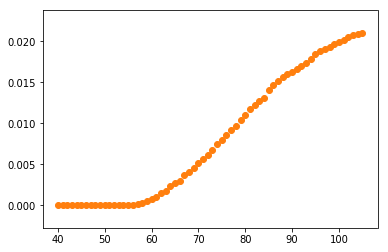

In [44]:
lincoln_county = fulldata[ fulldata['FIPS'] == '05079']

plt.scatter(lincoln_county['daysafter'], lincoln_county['cases_per_capita'])
plt.scatter(nyc['daysafter'], nyc['cases_per_capita'])
plt.show()

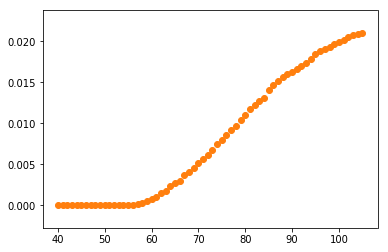

In [33]:
dakota_county = fulldata[ fulldata['FIPS'] == '31043']

plt.scatter(dakota_county['daysafter'], dakota_county['cases_per_capita'])
plt.scatter(nyc['daysafter'], nyc['cases_per_capita'])
plt.show()

# TODO explain results

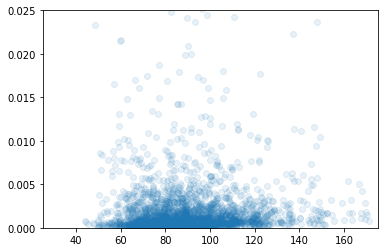

0.05206826701655316

In [18]:
plt.scatter(latest_date['Med_HH_Income_Percent_of_State_Total_2018'], latest_date['cases_per_capita'], alpha = .1)
plt.ylim(0,.025)
plt.xlim(25,175)
plt.show()

np.corrcoef(latest_date['Med_HH_Income_Percent_of_State_Total_2018'], latest_date['cases_per_capita'])[0][1]

In [19]:
for col in latest_date:
    if not isinstance(latest_date[col].values[0], str) and col != 'date' and col !='daysafter':
        print(col, ':   ', np.corrcoef(latest_date[col], latest_date['cases_per_capita'])[0][1])

Rural_urban_continuum_code_2013 :    -0.11683351163137934
Urban_influence_code_2013 :    -0.11112144070580203
Metro_2013 :    0.10134652959706575
Civilian_labor_force_2018 :    0.09433488875547485
Employed_2018 :    0.09442146038780339
Unemployed_2018 :    0.0904071533602748
Unemployment_rate_2018 :    -0.004087259455180757
Median_Household_Income_2018 :    0.08278533851541801
Med_HH_Income_Percent_of_State_Total_2018 :    0.05206826701655316
cases :    0.3454599748497979
deaths :    0.3095288580801325
ST :    -0.05629256345175669
AREA_SQMI :    -0.032881346074301765
E_TOTPOP :    0.09323240109390993
E_PCI :    0.053227306175656054
EP_POV :    0.015606561922483926
EP_NOHSDP :    0.10491278560383165
EP_AGE65 :    -0.14021456088440573
EP_AGE17 :    0.04134188047164187
EP_DISABL :    -0.10156516222241814
EP_SNGPNT :    0.12093291917841323
EP_MINRTY :    0.1845376509794251
EP_LIMENG :    0.17920959977110082
EP_MUNIT :    0.1129789167844957
EP_MOBILE :    -0.025285383384945046
EP_CROWD :   

In [20]:
for col in latest_date:
    if not isinstance(latest_date[col].values[0], str) and col != 'date' and col !='daysafter':
        print(col, ':   ', np.corrcoef(latest_date[col], latest_date['spread_speed'])[0][1])

Rural_urban_continuum_code_2013 :    0.0019472738290921116
Urban_influence_code_2013 :    -0.008012665138090947
Metro_2013 :    0.01237614891615294
Civilian_labor_force_2018 :    0.014218109896578412
Employed_2018 :    0.01419354328156814
Unemployed_2018 :    0.014499120320873679
Unemployment_rate_2018 :    -0.02708788049344309
Median_Household_Income_2018 :    0.016211498323627817
Med_HH_Income_Percent_of_State_Total_2018 :    0.0020849044480281257
cases :    0.1459201025637863
deaths :    0.12465080679339771
ST :    -0.02824413700640344
AREA_SQMI :    -0.022348223685070803
E_TOTPOP :    0.013623938731483699
E_PCI :    -0.005949536825934785
EP_POV :    0.013165225302277919
EP_NOHSDP :    0.08655610523837544
EP_AGE65 :    -0.05339441686844558
EP_AGE17 :    0.03562522132408187
EP_DISABL :    -0.06020154166873179
EP_SNGPNT :    0.03242971112731271
EP_MINRTY :    0.09681801855358868
EP_LIMENG :    0.10889652914362248
EP_MUNIT :    0.016842157849538013
EP_MOBILE :    -0.001443700786829481


# TODO
so it turns out that nothing is correlated to cases per capita... back to the drawing board :/

0.0019472738290921116


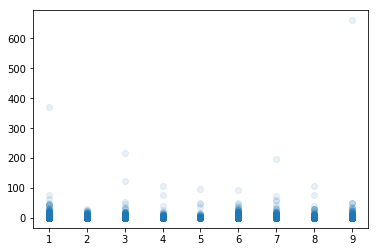

In [21]:
print(np.corrcoef(latest_date['Rural_urban_continuum_code_2013'], latest_date['spread_speed'])[0][1])

plt.scatter(latest_date['Rural_urban_continuum_code_2013'], latest_date['spread_speed'],alpha=.1)
plt.show()

In [22]:
# np.corrcoef(latest_date['Unemployment_rate_2018'], latest_date['Median_Household_Income_2018'])[0][1]

# plt.scatter(latest_date['Unemployment_rate_2018'], latest_date['Median_Household_Income_2018'], alpha=.1)
# plt.show()

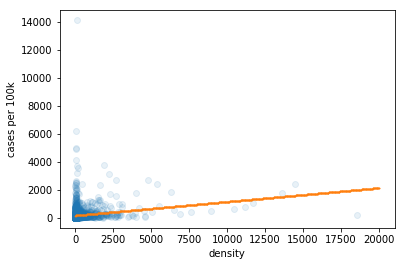

Model slope:      0.09862137008026778
Model intercept:  171.84984145443613
Correlation:      0.18206289174822982


In [23]:
plt.scatter(latest_date['density'], latest_date['cases_per_100k'], alpha = .1)

percap_vs_density = LinearRegression(fit_intercept=True)
percap_vs_density.fit(np.array(latest_date['density']).reshape(-1,1), latest_date['cases_per_100k'])
xfit2 = np.linspace(0, 20000, 1000)
yfit2 = percap_vs_density.predict(xfit2[:,np.newaxis])

plt.xlabel('density')
plt.ylabel('cases per 100k')

plt.scatter(xfit2,yfit2, s=.5)
plt.show()

print("Model slope:     ", percap_vs_density.coef_[0])
print("Model intercept: ", percap_vs_density.intercept_)
print("Correlation:     ", np.corrcoef(np.array(latest_date['E_TOTPOP']/latest_date['AREA_SQMI']), latest_date['cases_per_capita']*100000)[0][1])


In [24]:
latest_date['E_TOTPOP'].max()

10098052

In [25]:
latest_date['E_TOTPOP'].min()

454

In [26]:
def permuted_y():
    return np.random.permutation(latest_date['cases_per_100k'].copy())

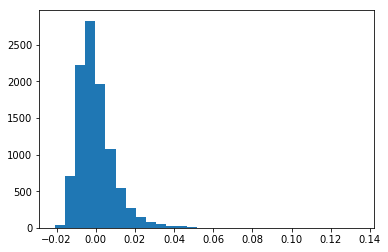

In [27]:
simul = np.zeros(10000)

for i in range(10000):
    model = LinearRegression().fit(latest_date[['density']], permuted_y())
    simul[i] = model.coef_[0]


plt.hist(simul, bins=30)
plt.show()


In [28]:
print('count out of 10000 random samples:  ', np.count_nonzero(simul > .0986))

count out of 10000 random samples:   12


In [29]:
latest_date.sort_values(by='spread_speed', ascending=False).head()

,FIPS,State,Area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,...,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES,cases_per_capita,cases_per_100k,density,first_day,days_since_first,spread_speed
64199,31117,NE,"McPherson County, NE",9.0,8.0,0.0,440,429,11,2.5,...,0.1646,0.0417,0.0643,0.0838,0.006608,660.792952,0.528537,104.0,1.0,660.792952
94585,47169,TN,"Trousdale County, TN",1.0,1.0,1.0,4888,4729,159,3.3,...,0.2200,0.4177,0.2862,0.5220,0.141231,14123.054424,83.722788,67.0,38.0,371.659327
63476,31043,NE,"Dakota County, NE",3.0,2.0,1.0,10777,10404,373,3.5,...,0.5419,0.9599,0.8055,0.8615,0.049909,4990.894325,76.883504,82.0,23.0,216.995405
53275,27105,MN,"Nobles County, MN",7.0,8.0,0.0,11284,10988,296,2.6,...,0.6657,0.9325,0.7533,0.8150,0.048949,4894.912771,30.540053,80.0,25.0,195.796511
5763,05079,AR,"Lincoln County, AR",3.0,2.0,1.0,4041,3867,174,4.3,...,0.2146,0.6390,0.9873,0.8134,0.062286,6228.550566,24.387353,55.0,50.0,124.571011


0.061684346346744544


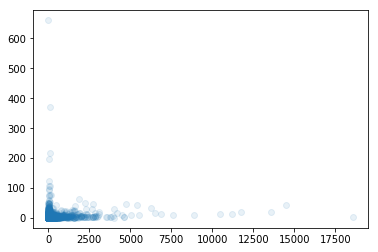

In [30]:
print(np.corrcoef(latest_date['density'], latest_date['spread_speed'])[0][1])

plt.scatter(latest_date['density'], latest_date['spread_speed'],alpha=.1)
plt.show()

In [89]:
def logit(x, coef, intercept):
    exp_x = np.exp(x * coef + intercept)
    return exp_x / (1 + exp_x)

[[0.00144706]] [-0.40708659]


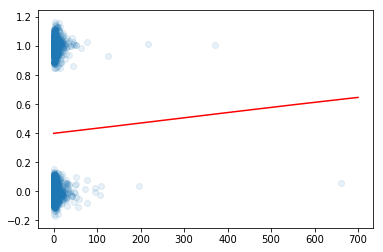

In [99]:
plt.scatter(latest_date['spread_speed'], latest_date['Metro_2013']+np.random.normal(0, 0.05, size=len(latest_date)), alpha=.1)

model = LogisticRegression(solver="lbfgs").fit(latest_date[['spread_speed']], latest_date['Metro_2013'])

print(model.coef_, model.intercept_)

x_values = np.linspace(0, 700, 1000)
plt.plot(x_values, logit(x_values, model.coef_[0,0], model.intercept_[0]), color='red')

plt.show()

In [32]:
fig = px.choropleth_mapbox(latest_date, geojson=counties, locations='FIPS', color='spread_speed',
                           color_continuous_scale="Viridis",
                           range_color=(0, 20),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           labels={'unemp':'unemployment rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Conclusions

## Acknowledgements